In [30]:
import pymupdf
from pathlib import Path
import json, os, re
from PIL import Image
import io
from rag_engine import RAGEngine
from rich.console import Console
console = Console()
from dotenv import load_dotenv
load_dotenv()

True

+++++++++++++++++++++ jardin_cactus.pdf +++++++++++++++++++++++++++
extracted jpeg width 800 height 533


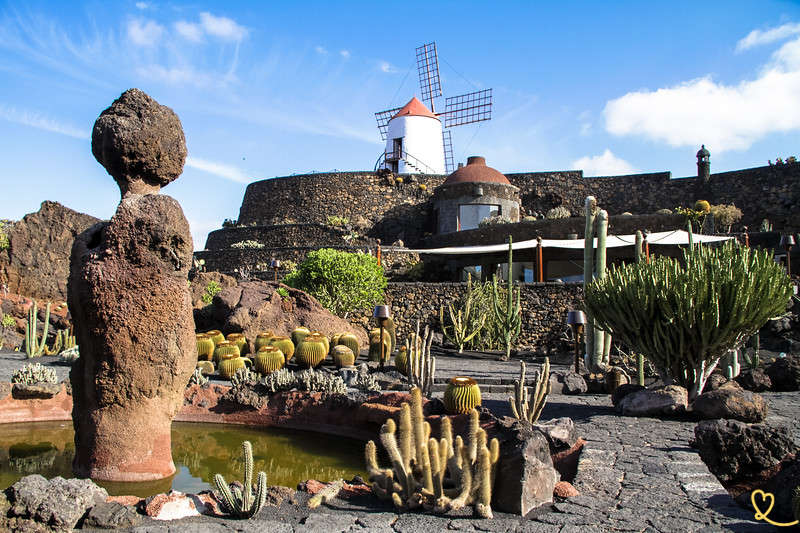

extracted jpeg width 800 height 533


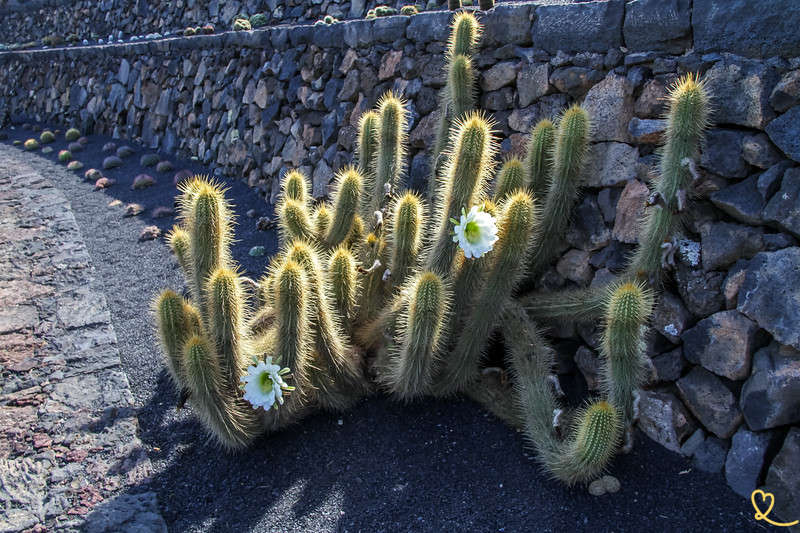

++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [32]:
docs = []
pdf_names = ["jardin_cactus.pdf",
#  "al_campesino.pdf", "fondation_tahiche.pdf", 
# "jameos_del_agua.pdf", "mirador_del_rio.pdf", "lag_o_mar.pdf", "maison_musee_haria_.pdf",
# "cueva_los_verdes.pdf","restaurant_el_diablo.pdf","works.pdf"
]

def extract_images_from_pdf(pdf_name):
    doc = pymupdf.open(Path.cwd().parent/"xdataset_manrique"/"manrique"/pdf_name)
    num_pages = doc.page_count
    for i in range(num_pages):
        images = doc.get_page_images(i)
        for img in images:
            extracted = doc.extract_image(img[0])
            print("extracted", extracted["ext"], "width", extracted["width"], "height", extracted["height"])
            pil_image = Image.open(io.BytesIO(extracted["image"]))
            print("==============================================")
            display(pil_image)
            docs.append(pil_image)

for pdf_name in pdf_names:
    print(f"+++++++++++++++++++++ {pdf_name} +++++++++++++++++++++++++++")
    extract_images_from_pdf(pdf_name)
    print("++++++++++++++++++++++++++++++++++++++++++++++++++++++")


In [33]:
docs

[<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x533>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=800x533>]

In [13]:
doc = pymupdf.open(Path.cwd()/"xdataset_manrique"/"maison_musee_haria.pdf")
print(json.dumps(doc.metadata, indent=2, ensure_ascii=False))

{
  "format": "PDF 1.7",
  "title": "",
  "author": "",
  "subject": "",
  "keywords": "",
  "creator": "",
  "producer": "Foxit PDF Editor Printer version 12.0.0.15105",
  "creationDate": "D:20251202030224+01'00'",
  "modDate": "D:20251202030224+01'00'",
  "trapped": "",
  "encryption": null
}


In [32]:
doc.page_count

4

In [27]:
images = doc.get_page_images(3)
for img in images:
    print(img)

(23, 0, 607, 405, 8, 'DeviceRGB', '', 'Im21', 'DCTDecode')
(16, 0, 607, 404, 8, 'DeviceRGB', '', 'Im22', 'DCTDecode')


In [28]:
first_image_xref = images[0][0]
print(doc.extract_image(first_image_xref))

{'width': 607, 'height': 405, 'ext': 'jpeg', 'colorspace': 3, 'xres': 96, 'yres': 96, 'bpc': 8, 'size': 66050, 'image': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\r\t\n\x0b\n\x08\r\x0b\n\x0b\x0e\x0e\r\x0f\x13 \x15\x13\x12\x12\x13\'\x1c\x1e\x17 .)10.)-,3:J>36F7,-@WAFLNRSR2>ZaZP`JQRO\xff\xdb\x00C\x01\x0e\x0e\x0e\x13\x11\x13&\x15\x15&O5-5OOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOO\xff\xc0\x00\x11\x08\x01\x95\x02_\x03\x01\x11\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\

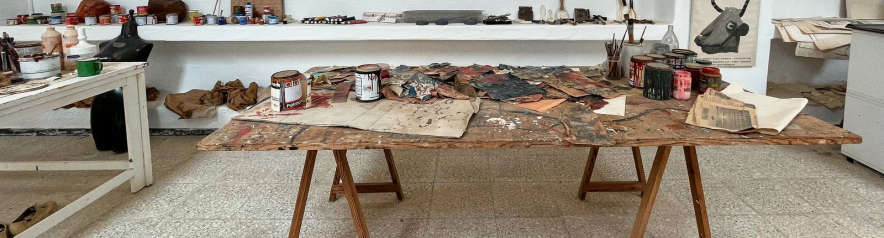

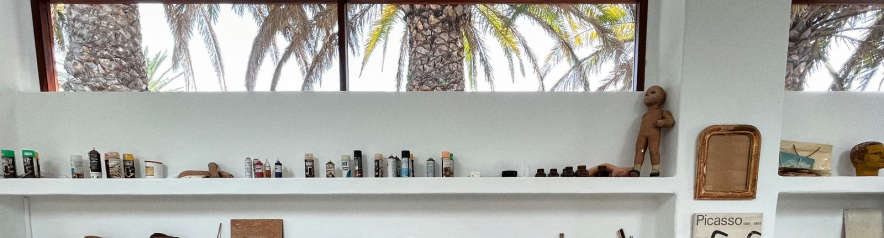

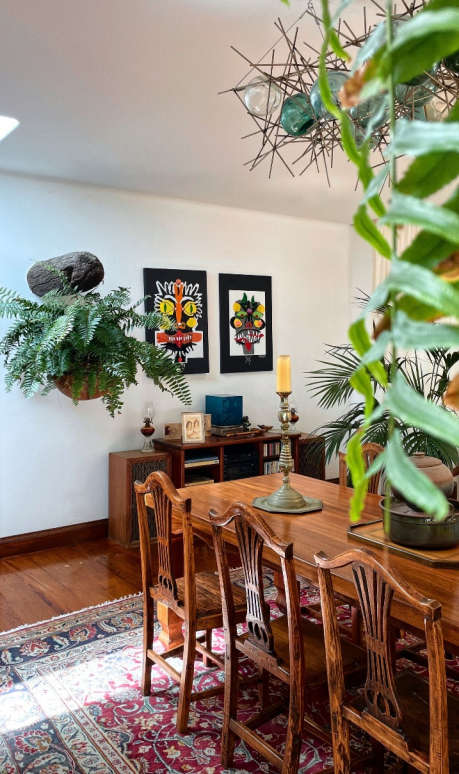

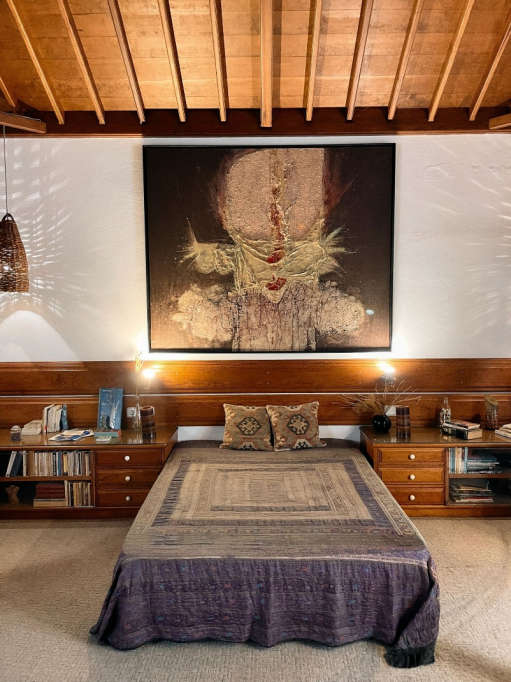

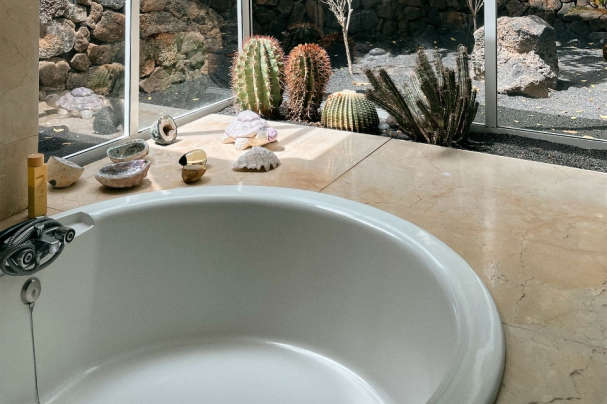

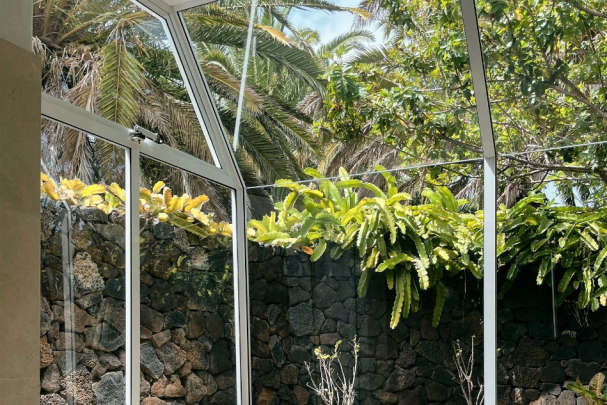

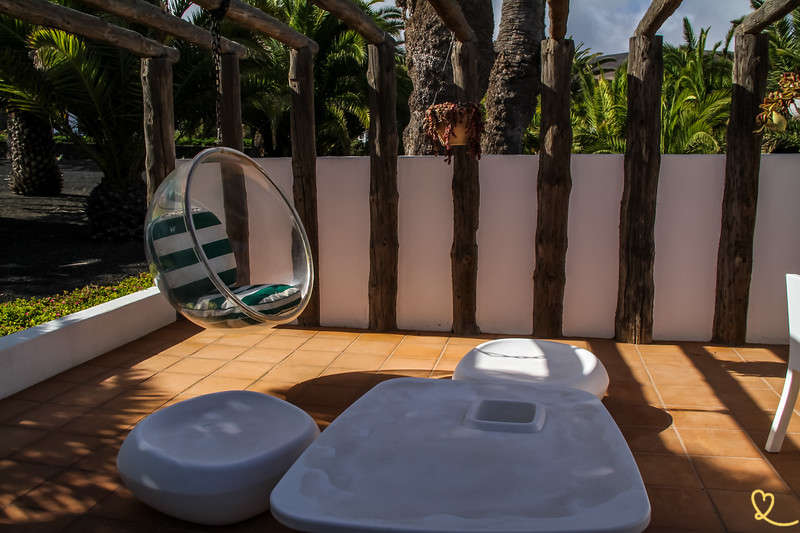

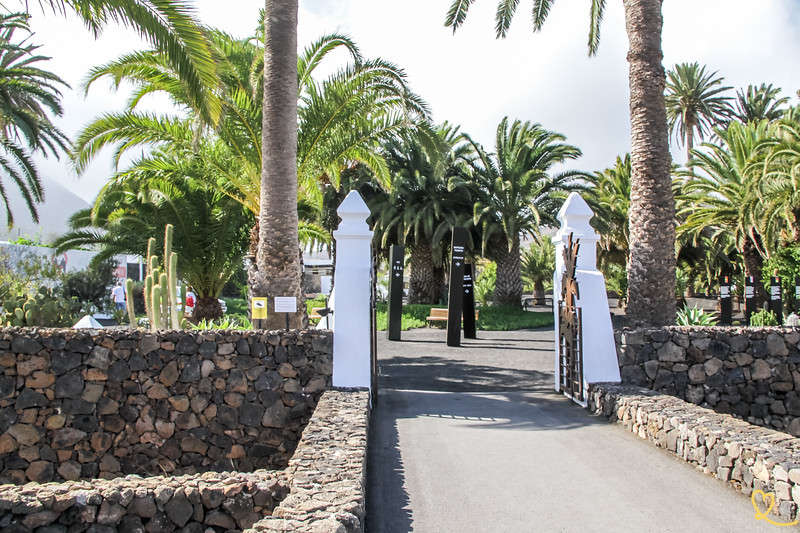

In [30]:
lenXREF = doc.xref_length()
for xref in range(1, lenXREF):
    if (doc.xref_get_key(xref,"Subtype")[1]=="/Image"):
        imgdata = doc.extract_image(xref)
        pil_image = Image.open(io.BytesIO(imgdata["image"]))
        display(pil_image)

In [78]:
import unicodedata
def extract_text_from_pdf(pdf_name, topic):
    doc = pymupdf.open(Path.cwd().parent/"xdataset_manrique"/"manrique"/pdf_name)
    pdf_pages = [] # List of page images for context
    for page_num, page in enumerate(doc):
        # 1. Extract Text
        text = page.get_text(flags=pymupdf.TEXT_USE_GID_FOR_UNKNOWN_UNICODE)
        if text.strip():
            print(f"========================= Page {page_num + 1} ============================== ")
            print(text)
            print()

In [79]:
print(extract_text_from_pdf("Activism.pdf", "manrique"))

========================= Page 1 ============================== 
Acvism 
  
Aer César’s return from New York in 1968, Lanzarote began to develop its tourist industry. 
Troubled about the possible implica(ons and consequences of that business, which he 
himself in conjunc(on with Island Council President José Ramírez Cerdá had helped spur, he 
expressed his concerns in the media on several occasions: ‘I’m a li4le worried about the 
impending avalanche of tourists we’ll be seeing in Lanzarote’ (1965). 
Lanzarote was firmly on its way to becoming a tourist service economy and Manrique 
realised that, given the value and beauty of its landscape, it would soon become the island’s 
primary source of wealth. He also knew, however, that in light of its extreme fragility, 
misguided ac(on could compromise that resource irreversibly. 
In keeping with those concerns, when hotel construc(on began to intensify in the mid 
nineteen seven(es and especially the mid eigh(es, Manrique par(cipated in p

In [10]:
engine = RAGEngine(use_stderr=True)

In [11]:
# Search for Text
query_text = "manrique"
results_text = engine.retrieve(query=query_text, topic="manrique", n_results=3)

for res in results_text:
    console.print(f" - Found: {res['content'].strip()[:50]}... (Score: {res['score']})")


********** Query:  manrique

- Found: Maison Musée de César Manrique... (Score: 0.724137127)

- Found: Biography 
César Manrique (1919-1992) was born at ... (Score: 0.718709171)

- Found: A view of the Monumento a la Fecundidad, a 15m scu... (Score: 0.703255475)

- Found: Maison Musée de César Manrique 
 
 
Maison Musée d... (Score: 0.699865758)

- Found: Sur de nombreux projets, César Manrique a collabor... (Score: 0.697390437)

- Found: César Manrique (1919-1992) 
César Manrique est né ... (Score: 0.694703)

- Found: Maison Musée de César Manrique 
 
• 
Nom officiel ... (Score: 0.694172084)

- Found: FONDATION CESAR MANRIQUE 
Créée en 1982 par César ... (Score: 0.6919052)

- Found: sables et de terres. Après des incisions de référe... (Score: 0.677884)

- Found: 5. Al Campesino 
 
Al Campesino a été conçu par Cé... (Score: 0.675332665)

- Found: César Manrique's atelier, featuring a table covere... (Score: 0.661941707)

- Found: 2. Jameos del Agua 
 
Situé au nord de l’île, Jame... (Score: 0.660841763)

- Found: Restaurant El Diablo in Parc National Timanfaya... (Score: 0.648131609)

- Found: 3. Mirador del Rio 
 
Situé sur le Risco de Famara... (Score: 0.648066282)

- Found: 6. Maison Musée de César Manrique 
 
Située dans l... (Score: 0.644576371)

In [28]:
query_image = "painting"
results_image = engine.retrieve(query=query_image, topic="manrique", n_results=25)
for res in results_image:
    if res['type'] == 'image':
        console.print(f" - Found: {res['content'].strip()} (Score: {res['score']})")

********** Query:  painting

- Found: Painting titled Sin título. (Score: 0.803119063)

- Found: Painting titled Bodegón. (Score: 0.793528616)

- Found: Painting titled Ignota. (Score: 0.737885177)

- Found: Graphic design titled Sin título. (Score: 0.659570277)

- Found: Sculpture titled Fobos. (Score: 0.624477863)

- Found: A bedroom inside César Manrique's house, featuring a large painting above the bed. (Score: 0.60969615)

In [14]:
res

{'id': '4af35537-a984-40d6-b5c2-1f57140a51a9',
 'score': 0.592532873,
 'type': 'text',
 'content': 'Maison Musée de César Manrique \n \n• \nNom officiel – Casa/Museo César Manrique \n \n \n \n',
 'metadata': {'page': 4,
  'source': 'temp_maison_musee_haria_.pdf',
  'text': 'Maison Musée de César Manrique \n \n• \nNom officiel – Casa/Museo César Manrique \n \n \n \n',
  'type': 'text'}}

In [19]:
res

{'id': '5b6598e4-e8bd-43b8-b623-419f39ae7b05',
 'score': 0.634380519,
 'type': 'image',
 'content': "The entrance to César Manrique's house in Haría, surrounded by palm trees and cactus.",
 'metadata': {'description': "The entrance to César Manrique's house in Haría, surrounded by palm trees and cactus.",
  'image_path': 'https://storage.googleapis.com/rag-assets-bucket/temp_maison_musee_haria_.pdf_1_0.png',
  'page': 1,
  'source': 'temp_maison_musee_haria_.pdf',
  'text': "The entrance to César Manrique's house in Haría, surrounded by palm trees and cactus.",
  'type': 'image'}}